In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np
import cv2
import pandas as pd
import ultralytics
from ultralytics import YOLO
from skimage.io import imread, imshow
import json
from pycocotools import mask as maskUtils

In [32]:
# Load COCO style annotations
with open("labels_my-project-name_2025-05-07-04-05-45.json", "r") as f:
    data = json.load(f)

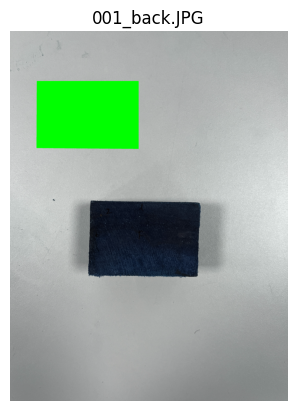

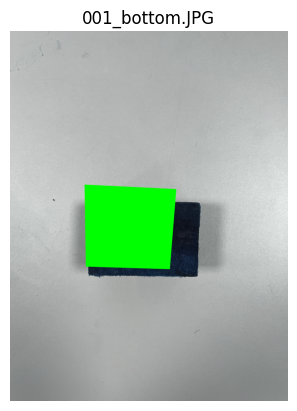

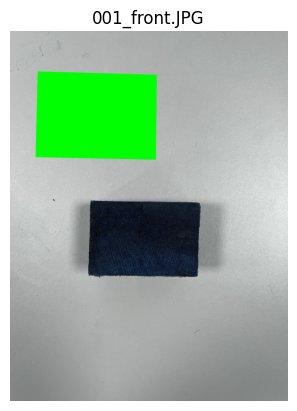

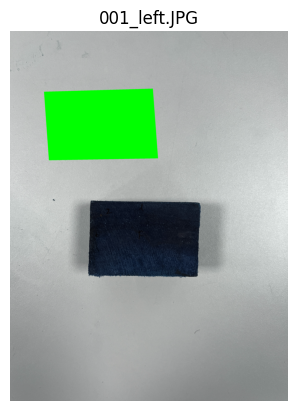

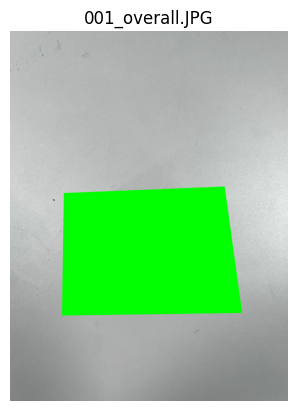

...

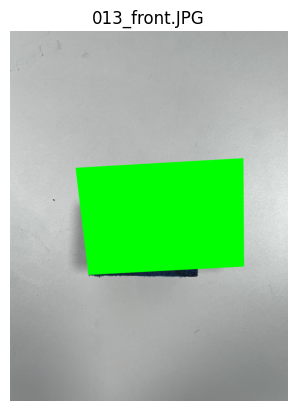

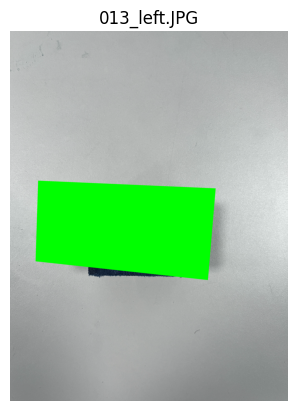

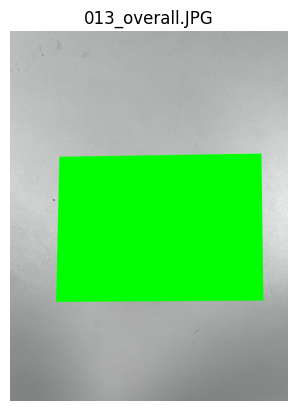

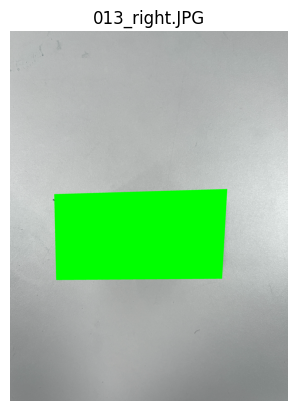

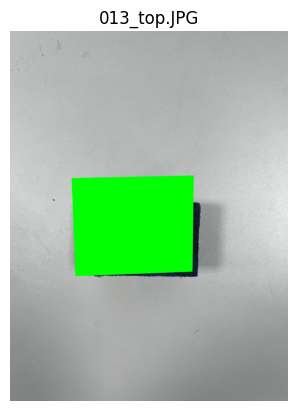

KeyboardInterrupt: 

In [39]:
img_id_to_filename = {img['id']: img['file_name'] for img in data['images']}

for ann in data['annotations']:
    image_id = ann['image_id']
    file_name = img_id_to_filename[image_id]
    image_path = f"C:\\Users\\user\\IISC Internship\\biomass_dataset\\Biomass_after_bonedry\\biomass_after_soaking\\soaked_sample_images\\002_front.JPG"

    if not os.path.exists(image_path):
        continue

    img = cv2.imread(image_path)

    segmentation = ann['segmentation']

    if isinstance(segmentation, list):
        pts = np.array(segmentation[0]).reshape(-1, 2).astype(np.int32)
        cv2.polylines(img, [pts], isClosed=True, color=(0, 255, 0), thickness=2)
        cv2.fillPoly(img, [pts], color=(0, 255, 0, 30))
        
    elif isinstance(segmentation, dict):  # RLE
        mask = maskUtils.decode(segmentation)
        img[mask == 1] = [0, 255, 0]

    plt.imshow(img)
    plt.title(file_name)
    plt.axis('off')
    plt.show()

In [5]:
#ultralytics version check
ultralytics.checks()


Ultralytics 8.3.128  Python-3.12.10 torch-2.6.0+cpu CPU (Intel Core(TM) i5-8265U 1.60GHz)
Setup complete  (8 CPUs, 7.8 GB RAM, 225.3/237.3 GB disk)


In [9]:
model = YOLO("yolov8x-seg.pt")

In [14]:
#image
initial_image_folder="C:\\Users\\user\\IISC Internship\\biomass_dataset\\Biomass_before_bonedry\\biomass_before_bonedry"
output = 'output.csv'
feature_rows = []

In [22]:
#extracting features
def extract_features(segmented_image):
    mean_color = np.mean(segmented_image, axis=(0, 1))
    return mean_color.tolist()

os.makedirs("segmented_outputs", exist_ok=True)

In [26]:
for filename in os.listdir(initial_image_folder):
    if filename.endswith(('.jpg', '.jpeg', '.png')):
        image_path = os.path.join(initial_image_folder, filename)
        image = cv2.imread(image_path)

        #running YOLOv8 segmentation
        results = model(image)[0]

        if results.masks is not None and len(results.masks.data)>0:
            # Get first mask
            mask = results.masks.data[0].cpu().numpy()
            mask = (mask * 255).astype(np.uint8)

            # Create color overlay mask
            color_mask = np.zeros_like(image)
            color_mask[:, :, 1] = mask  # Green channel

            # Blend mask with original image
            vis = cv2.addWeighted(image, 0.7, color_mask, 0.3, 0)

            # Save visualization
            output_path = os.path.join("segmented_outputs", f"seg_{filename}")
            cv2.imwrite(output_path, vis)

            print(f"✅ Saved segmented visualization: {output_path}")
        
        else:
            print('No file detected')

print(feature_rows)

# Save to CSV
if feature_rows:
    columns = ["filename"] + [f"feature_{i}" for i in range(len(feature_rows[0]) - 1)]
    df = pd.DataFrame(feature_rows, columns=columns)
    df.to_csv(output, index=False)
    print(f"✅ Features saved to {output}")
else:
    print('No features extracted')


[]
No features extracted
